## Imports & Helpers

In [4]:
pwd

'/home/jupyter/checkmate-histo/consolidated_workflow'

In [5]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('../')
from checkmate_imports import *

# global variables 
HUE_ORDER = ['stroma','pred_g2','intermediate_grade','pred_g4']
MIN_SEGMENT_SIZE = 50
GRADE_DIFF_THRESH = 0.35
TUMOR_DIFF_THRESH = 0.35
MIN_TUMOR_SEG_MEAN = 0.70
NODE_DIFF_CUTOFF = invert_rag_weight(GRADE_DIFF_THRESH) 
MIN_TIL_COUNT = 10

# GRADE_TC_CUTOFF = 0.4  # minimum segment mean grade score to consider in TIL processing 
# GRADE_TC_CUTOFF = 0.  # minimum segment mean grade score to consider in TIL processing 
GRADE_TC_CUTOFF = 0.8  # focusing on high grade foci only 

print('MODIFYING EARLIER TIL CUTOFFS')
TIL_ISO_CUTOFF = 14  # based on none vs any AUROC bootstrap on high grade foci + no hard cases
TIL_HIGH_CUTOFF = 48 # based on not-high vs high AUROC bootstrap on high grade foci + no hard cases
FRAC_CUTOFF = 0.25
TIL_AREA_CUTOFF = 10

EXCLUSION_RATIO_CUTOFF = 1.5  # margin vs center ratio threshold for "exclusion" call
TILES_PER_MM2 = 0.256**-2

# assume 7x7 minimum case for a square area focus
# going 2 tiles inner would result in a 5x5 inner cube and thus area cutoff of 25
# MIN_CENTER_AREA = 25
MIN_CENTER_AREA = 10  # relaxing from 25 to try to recover possible interesting foci

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
MODIFYING EARLIER TIL CUTOFFS


In [6]:
from statannotations.Annotator import Annotator
from statannot import add_stat_annotation
from itertools import combinations, product

### Load saved files 

In [7]:
feature_subset = pd.read_csv('./rerun_final_patient_features.csv', index_col=0)

anno = pd.read_csv('manual_cm025_merged_braunsupp_annotations.csv') 
anno['unique_id'] = 'cm025_' + anno.subjid.astype(str)
paper_desert = anno.loc[anno.ImmunoPhenotype == 'Desert','unique_id'].values
paper_infl = anno.loc[anno.ImmunoPhenotype == 'Infiltrated','unique_id'].values
paper_excl = anno.loc[anno.ImmunoPhenotype == 'Excluded','unique_id'].values
anno = anno.set_index('unique_id')

node_descriptions = pd.read_csv('./rerun_node_descriptions_with_score_components.csv',index_col=[0])
node_descriptions['merged_labels'] = node_descriptions['merged_labels'].astype(int)

prox_dist_edges = pd.read_csv('./rerun_proximal_and_distal_edge_annotations_with_score_components.csv',index_col=0)

scores = pd.read_csv('./rerun_slidewise_grade_til_scores.csv', index_col=0)

load_tile_info = False

if load_tile_info:
    tilewise_anno = pd.read_csv('./rerun_tilewise_grade_til_annotations.csv', index_col=0) # TIL specific CM025 subset

    edge_info = pd.read_csv('./rerun_base_rag_edge_info_annotation.csv', index_col=[0,1,2,3])
    # restore set objects (stored as string when saved to csv earlier)
    edge_info['edge_set'] = edge_info.reset_index()[['edge0','edge1']].apply(lambda x: set(x),1).values

    # read in non-TIL tilewise info 
    seg_agg = pd.read_csv('./rerun_tilewise_grade_nontil_annotations.csv', index_col=0)
    
    edge_agg_pivot = pd.read_csv('./rerun_base_rag_edge_info_annotation_processed.csv', index_col=[0,1,2])
    edge_class_sum = pd.read_csv('./rerun_base_rag_edge_info_annotation_processed_sum.csv', index_col=0)
    edge_binary = edge_class_sum > 0

#### Load watershed outputs again

In [8]:
seg_outs = {}
for cohort in ['cm025','kirc','profile']:
    seg_outs[cohort] = torch.load(f'rerun_{cohort}_twostage_watershed_out_rerun.pkl')

seg_out_agg = {}
failed_ids = []
failed_data_agg = {}
for cohort, seg_out_data in seg_outs.items():
    for entry in seg_out_data:
        try:
            unique_id = entry['unique_id']
            seg_out_agg[unique_id] = entry
        except:
            uid = entry['seg_df']['unique_id'].unique()[0]
            failed_ids.append(uid)
            failed_data_agg[uid] = entry['seg_df']

In [9]:
edge_agg_pivot = pd.read_csv('./rerun_base_rag_edge_info_annotation_processed.csv', index_col=[0,1,2])

In [30]:
from openslide import OpenSlide
def visualize_multiple_heatmaps(plotting_df, unique_id, outdir='./roi_outputs', margin=5, window_size=5, overlay_var=['til_counts','smoothed_prob_g4_not_g2'], path_vars=['full_path'], 
                        tumor_cutoff=None, vmin=0, vmax=1, invert_yaxis=False, save_figs=True):
    """
    truncation of `check_example_multi_mod`

    """
    subplot_store = {}
    n_cols = len(overlay_var)
    set_rc(n_cols*5, 5, font_scale=1.8)
    fig, axes = plt.subplots(1, n_cols)
    
    vmax_mapper = {'roi_full_path':vmax}
    
    for idx, col in enumerate(overlay_var):
        heatmap = get_separated_heatmaps_simplified(plotting_df.reset_index().rename(columns={'tx':'x', 'ty':'y'}), col=col)
        if col.endswith('counts'):
            vmax_mapper[col] = 100
        elif col.endswith('ratio'):
            vmax_mapper[col]=5
        elif col == 'gradient':
            vmax_mapper[col]=50
        else:
            vmax_mapper[col]=vmax
        sns.heatmap(heatmap, vmax=vmax_mapper[col], ax=axes[idx])
        axes[idx].set_title(col)
        
        subplot_store[f'heatmap_{col}'] = heatmap
        
    plt.show()

In [33]:
til_norm_vis_cutoff = 50
hg_inf_cutoff = 0.0556179

col_sub = ['prob_tumor', 'prob_g4_not_g2','smoothed_prob_tumor', 'smoothed_prob_g4_not_g2', 'meta','full_path', 'infiltrated','infiltrated_re', 'high_grade']

tilewise_anno = pd.read_csv('./rerun_tilewise_grade_til_annotations.csv',index_col=0)
tilewise_anno['above_til_cutoff'] = tilewise_anno['til_counts'] > TIL_ISO_CUTOFF

slidemean = tilewise_anno.groupby('unique_id').mean()
segmentmean = tilewise_anno.loc[tilewise_anno.meta != 'stroma'].groupby(['unique_id','merged_labels']).mean()

hg_full = (segmentmean['smoothed_prob_g4_not_g2'] >= GRADE_TC_CUTOFF).groupby('unique_id').apply(np.all).map({True:'only_high_grade',False:'not_all_high_grade'})

feature_subset['pure_high_grade'] = hg_full
feature_subset['pure_high_grade'] = feature_subset['pure_high_grade'].fillna('missing')

segmentmean['infiltrated'] = segmentmean['above_til_cutoff'] > hg_inf_cutoff
segmentmean['high_grade'] = segmentmean['smoothed_prob_g4_not_g2'] >= GRADE_TC_CUTOFF

tilewise_anno = merge_nonoverlapping(tilewise_anno.set_index(['merged_labels'],append=True), segmentmean)
tilewise_anno = tilewise_anno.reset_index(level=1, drop=False)
tilewise_anno = tilewise_anno.set_index(['x','y'], append=True)
tilewise_anno['infiltrated_re'] = tilewise_anno['infiltrated'].map({np.nan:0, False:0.5, True:1.})

In [38]:
# mkdir ./overlays/hg_til_subset

In [ ]:
%%capture
set_rc(15,15)
df = prepare_cm025_subset(feature_subset, anno=anno, drug_type='any', high_grade_filter=True)

# for uid in df.loc[(df['any_hg_diff_edge'] == 'high_grade_diff_edge') & (df['global_infiltration_bin'] == 'high_hg_global_infiltration'), 'os'].sample(5).index.values:
for (g0, g1, uid) in df.groupby(['any_hg_diff_edge','global_infiltration_bin']).apply(lambda x: x.sample(5)).index.values:
    num_id = int(uid.split('_')[1])
    print(uid)
    thumbs = glob(f'/mnt/disks/manual_bms/histoqc_masks_20210422/*CA209-025;*;*{str(num_id).zfill(4)};Screening*/*thumb_small*')
    thumb_img = plt.imread(thumbs[0])
#     print(thumb_img.shape)
#     plt.imshow(thumb_img)
#     plt.savefig(f'./overlays/hg_til_subset/{g0}_{g1}_{uid}_hne_thumb.pdf', bbox_inches='tight')
#     plt.show()
    
    input_df = tilewise_anno.loc[uid].reset_index().set_index(['x','y'])[col_sub+['merged_labels','til_counts']]
    input_df['til_counts'] = input_df['til_counts'].astype(np.uint8)
    input_df['til_counts_normed'] = np.clip(input_df['til_counts'], 0, til_norm_vis_cutoff)/til_norm_vis_cutoff
    #     input_df['infiltrated'] = input_df['infiltrated'] & input_df['high_grade']

    input_df['infiltrated_tile'] = (input_df['til_counts'] > TIL_ISO_CUTOFF).astype(int)
    input_df['seg_vis'] = input_df['merged_labels']/input_df['merged_labels'].max()
    input_df.loc[input_df['merged_labels'].isin(get_indices(segmentmean.loc[uid, 'smoothed_prob_g4_not_g2'] >= 0.8)), 'passing_seg_label'] = True
    input_df['passing_seg_label'] = input_df['passing_seg_label'].fillna(False).astype(int)
    
    # code low grade foci as color 0 
    input_df.loc[input_df['passing_seg_label'] == 0, 'infiltrated_re'] = 0
    input_df.loc[input_df['passing_seg_label'] == 0, 'til_counts_normed'] = 0.5

    heatmap = get_separated_heatmaps_simplified(input_df.reset_index().rename(columns={'tx':'x', 'ty':'y'}), col='smoothed_prob_tumor')
    
    slide = OpenSlide(glob(f'/mnt/disks/manual_bms/*CA209-025;*;*{str(num_id).zfill(4)};Screening*svs')[0])
    
    heatmap_to_thumb_scale = 500/(slide.dimensions[0]//512)
    placeholder = -np.ones([x//512 for x in [slide.dimensions[1],slide.dimensions[0]]])
    placeholder[:heatmap.shape[0], :heatmap.shape[1]] = heatmap

    est_scale = heatmap_to_thumb_scale
    rescaled_heatmap = rescale(heatmap, est_scale, anti_aliasing=True)
    
    ### TRIMMED HNE THUMB
    plt.imshow(thumb_img)
    plt.xlim(0,rescaled_heatmap.shape[1])
    plt.ylim(rescaled_heatmap.shape[0],0)
    plt.savefig(f'./overlays/hg_til_subset/{g0}_{g1}_{uid}_hne_raw_trimmed.pdf')
    plt.show()
    
    ### TUMOR VS STROMA
    heatmap = get_separated_heatmaps_simplified(input_df.reset_index().rename(columns={'tx':'x', 'ty':'y'}), col='smoothed_prob_tumor')
    ex_out = seg_out_agg[uid]
    mod_im = np.ma.masked_array(ex_out['seg_images']['all'], mask = np.isnan(ex_out['seg_images']['all'])).filled(0)
    mod_labels = np.ma.masked_array(ex_out['seg_out']['merged_labels'], mask = np.isnan(ex_out['seg_images']['all'])).filled(ex_out['seg_out']['merged_labels'].max()+1)
    label_clone = mod_labels.copy()

    overlay_copy = np.copy(heatmap)
    overlay_copy[~(label_clone == 0)] = 1-overlay_copy[~(label_clone == 0)] 
    overlay_copy[(label_clone == 0)] = 0.5

    est_scale = heatmap_to_thumb_scale
    rescaled_heatmap = rescale(overlay_copy, est_scale, anti_aliasing=True)
    plt.xlim(0,rescaled_heatmap.shape[1])
    plt.ylim(rescaled_heatmap.shape[0],0)
    plt.imshow(rescaled_heatmap, cmap='RdBu', vmin=0, vmax=1)
    plt.imshow(thumb_img, alpha=0.5)
    plt.savefig(f'./overlays/hg_til_subset/{g0}_{g1}_{uid}_prob_tumor_overlay.pdf', bbox_inches='tight')
    plt.show()
    
    
    ### GRADE
    heatmap = get_separated_heatmaps_simplified(input_df.reset_index().rename(columns={'tx':'x', 'ty':'y'}), col='smoothed_prob_g4_not_g2')
    ex_out = seg_out_agg[uid]
    mod_im = np.ma.masked_array(ex_out['seg_images']['all'], mask = np.isnan(ex_out['seg_images']['all'])).filled(0)
    mod_labels = np.ma.masked_array(ex_out['seg_out']['merged_labels'], mask = np.isnan(ex_out['seg_images']['all'])).filled(ex_out['seg_out']['merged_labels'].max()+1)
    label_clone = mod_labels.copy()

    overlay_copy = np.copy(heatmap)
    overlay_copy[~(label_clone == 0)] = 1-overlay_copy[~(label_clone == 0)] 
    overlay_copy[(label_clone == 0)] = 0.5
    overlay_copy[(label_clone == label_clone.max())] = 0.5

    est_scale = heatmap_to_thumb_scale
    rescaled_heatmap = rescale(overlay_copy, est_scale, anti_aliasing=True)
    plt.xlim(0,rescaled_heatmap.shape[1])
    plt.ylim(rescaled_heatmap.shape[0],0)
    plt.imshow(rescaled_heatmap, cmap='PuOr', vmin=0, vmax=1)
    plt.imshow(thumb_img, alpha=0.5)
    plt.savefig(f'./overlays/hg_til_subset/{g0}_{g1}_{uid}_prob_g4notg2_overlay.pdf', bbox_inches='tight')
    plt.show()
    
    ### GRADE SEGS
    heatmap = get_separated_heatmaps_simplified(input_df.reset_index().rename(columns={'tx':'x', 'ty':'y'}), col='seg_vis')
    overlay_copy = np.copy(heatmap)
    overlay_copy[~(label_clone == 0)] = 1-overlay_copy[~(label_clone == 0)] 
    overlay_copy[(label_clone == 0)] = 10

    plt.xlim(0,rescaled_heatmap.shape[1])
    plt.ylim(rescaled_heatmap.shape[0],0)
    est_scale = heatmap_to_thumb_scale
    rescaled_heatmap = rescale(overlay_copy, est_scale, order=0, preserve_range=True, anti_aliasing=False)

    plt.imshow(rescaled_heatmap, cmap='Pastel1', vmin=0, vmax=1)
    plt.imshow(thumb_img, alpha=0.25)
    plt.savefig(f'./overlays/hg_til_subset/{g0}_{g1}_{uid}_qualitative_segment_labels_overlay.pdf', bbox_inches='tight')
    plt.show()
    
    ### HG TIL
    heatmap = get_separated_heatmaps_simplified(input_df.reset_index().rename(columns={'tx':'x', 'ty':'y'}), col='til_counts_normed')
    overlay_copy = np.copy(heatmap)
    overlay_copy[~(label_clone == 0)] = 1-overlay_copy[~(label_clone == 0)] 
    overlay_copy[(label_clone == 0)] = 0.5
    
    plt.xlim(0,rescaled_heatmap.shape[1])
    plt.ylim(rescaled_heatmap.shape[0],0)
    est_scale = heatmap_to_thumb_scale
    rescaled_heatmap = rescale(overlay_copy, est_scale, order=0, preserve_range=True, anti_aliasing=False)

    
    plt.imshow(rescaled_heatmap, cmap='RdBu', vmin=0, vmax=1)
    plt.imshow(thumb_img, alpha=0.5)
    plt.savefig(f'./overlays/hg_til_subset/{g0}_{g1}_{uid}_high_grade_normed_infiltration_overlay.pdf', bbox_inches='tight')
    plt.show()
    
    
    ### RAGs
    #### Proximal
    try:
        filtered_rags = prepare_distal_rag(seg_out_agg[uid], uid, edge_agg_pivot.loc[uid])
        for edge_type in ['proximal','distal']:
            ax = plt.gca()
            rag = filtered_rags[f'g_{edge_type}'].copy()
            min_segment_size = 25
            img_cmap='Reds_r'


            g = rag.copy()
            to_remove = []
            for node_name in g.nodes:
                if g.nodes[node_name]['pixel count'] < MIN_SEGMENT_SIZE:
                    to_remove.append(node_name)
            for node_name in to_remove:
                g.remove_node(node_name)

            overlay_copy = np.copy(mod_im)
            overlay_copy[~((label_clone == 0) | (label_clone == label_clone.max()))] = 1-overlay_copy[~((label_clone == 0) | (label_clone == label_clone.max()))]
            overlay_copy[(label_clone == label_clone.max())] = 0.5
            overlay_copy[(label_clone == 0)] = 0.5


            ax = plt.gca()
            lc = graph.show_rag(label_clone, g, overlay_copy, border_color='black', 
                                edge_width=5,
                                img_cmap='RdBu', edge_cmap='Greys', ax=ax)

            flipped_centroids = {node_key: (y,x) for node_key, (x,y) in nx.get_node_attributes(g,'centroid').items()}  
            edge_colors = nx.get_edge_attributes(g,'weight').values()
            nx.draw(g, flipped_centroids, ax=ax, edge_color=edge_colors, edge_vmin=0, edge_vmax=1.75, with_labels=True)
            plt.savefig(f'./overlays/hg_til_subset/{g0}_{g1}_{uid}_{edge_type}_rag_no_overlay_centered_RdBu.pdf', bbox_inches='tight')
            plt.show()
    except:
        print('no edge?')

cm025_180


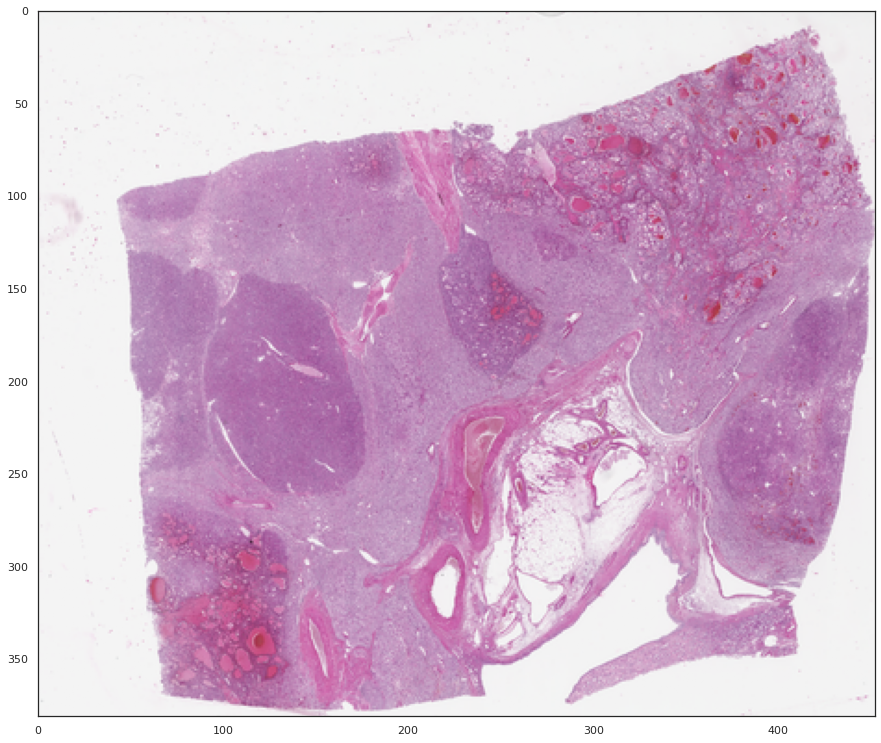

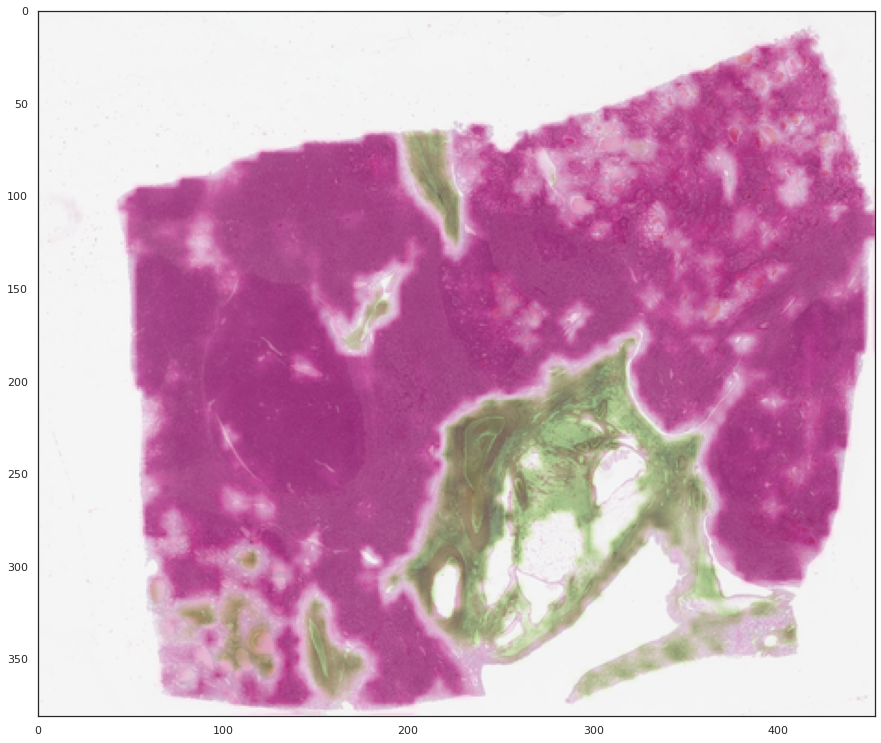

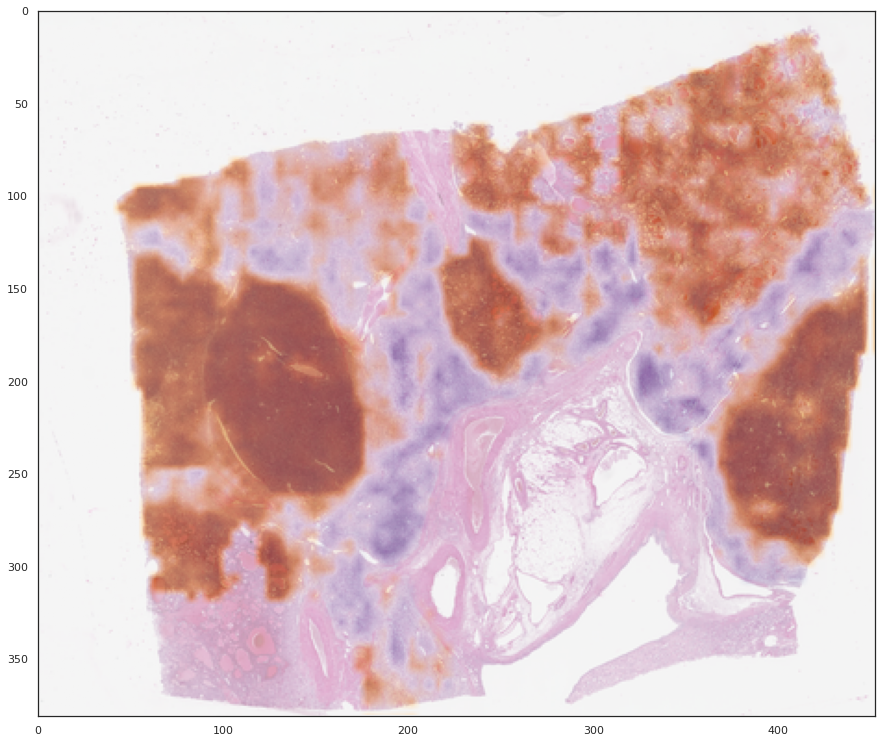

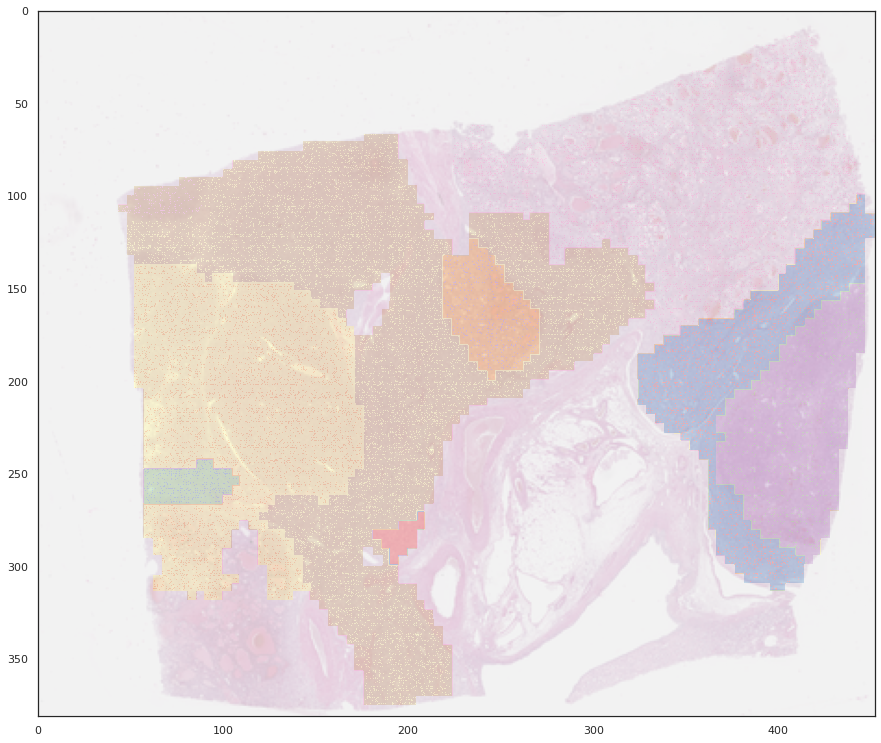

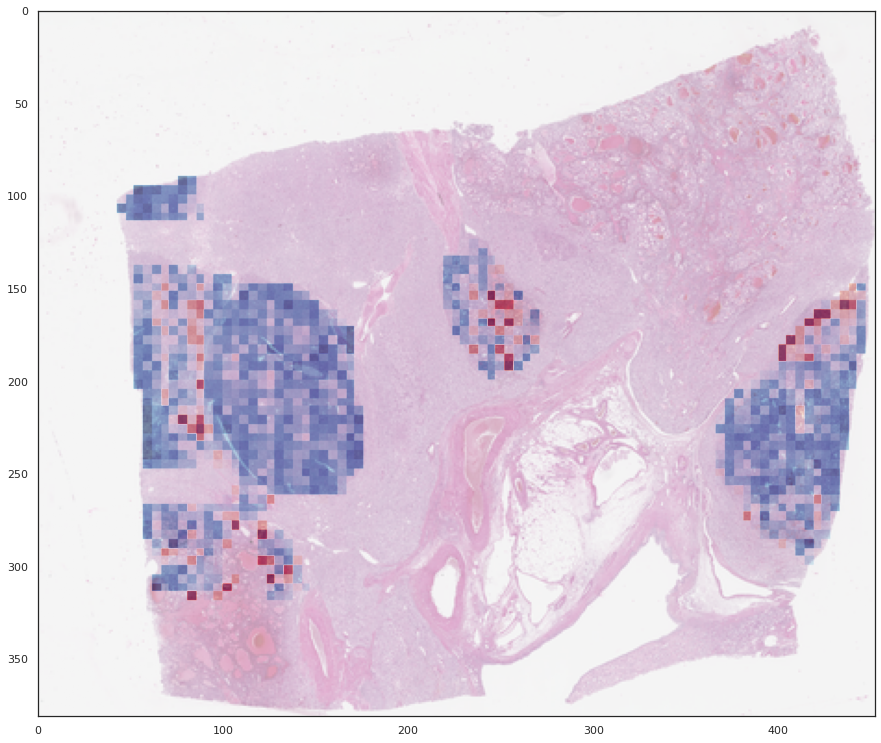

could not find expansion dist @ 25, replacing with 10


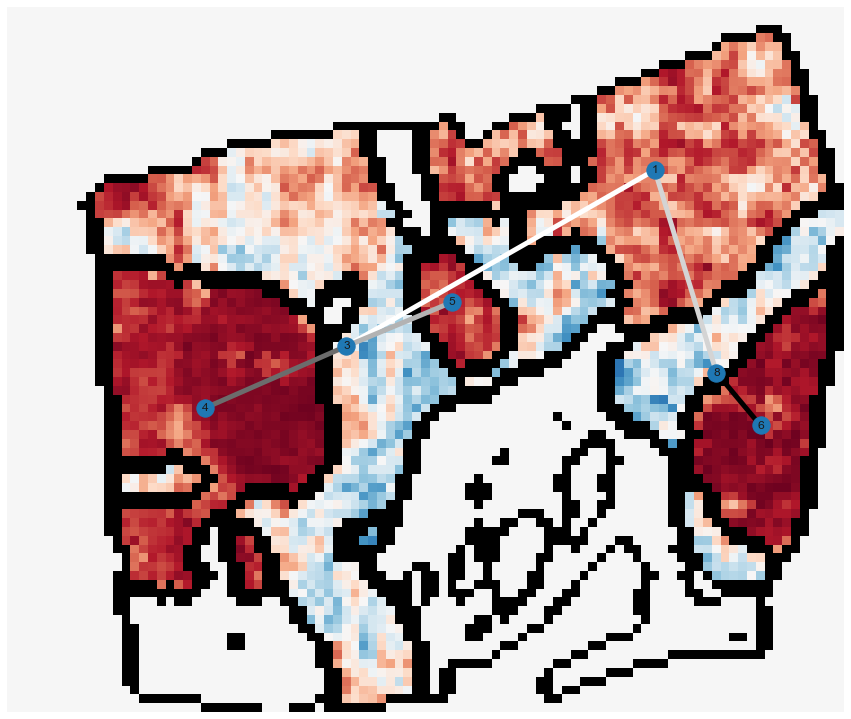

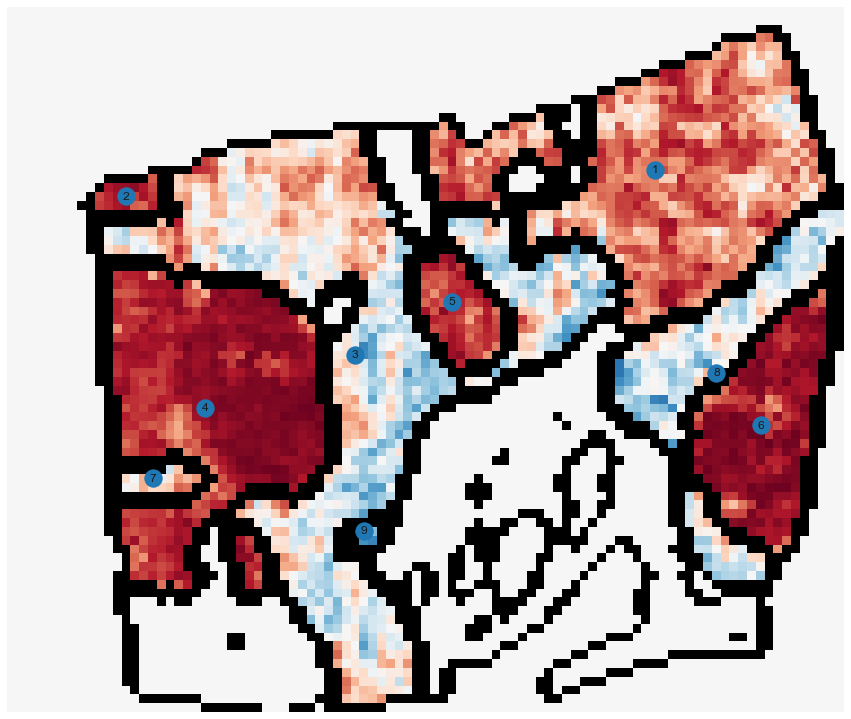

In [46]:
# %%capture
set_rc(15,15)
tvnt_cmap = 'PiYG'

for num_id in [180]:
    uid = f'cm025_{num_id}'
    print(uid)
    thumbs = glob(f'/mnt/disks/manual_bms/histoqc_masks_20210422/*CA209-025;*;*{str(num_id).zfill(4)};Screening*/*thumb_small*')
    thumb_img = plt.imread(thumbs[0])
#     print(thumb_img.shape)
#     plt.imshow(thumb_img)
#     plt.savefig(f'./overlays/{uid}_hne_thumb.pdf', bbox_inches='tight')
#     plt.show()
    
    input_df = tilewise_anno.loc[uid].reset_index().set_index(['x','y'])[col_sub+['merged_labels','til_counts']]
    input_df['til_counts'] = input_df['til_counts'].astype(np.uint8)
    input_df['til_counts_normed'] = np.clip(input_df['til_counts'], 0, til_norm_vis_cutoff)/til_norm_vis_cutoff
    #     input_df['infiltrated'] = input_df['infiltrated'] & input_df['high_grade']

    input_df['infiltrated_tile'] = (input_df['til_counts'] > TIL_ISO_CUTOFF).astype(int)
    input_df['seg_vis'] = input_df['merged_labels']/input_df['merged_labels'].max()
    input_df.loc[input_df['merged_labels'].isin(get_indices(segmentmean.loc[uid, 'smoothed_prob_g4_not_g2'] >= 0.8)), 'passing_seg_label'] = True
    input_df['passing_seg_label'] = input_df['passing_seg_label'].fillna(False).astype(int)
    
    # code low grade foci as color 0 
    input_df.loc[input_df['passing_seg_label'] == 0, 'infiltrated_re'] = 0
    input_df.loc[input_df['passing_seg_label'] == 0, 'til_counts_normed'] = 0.5

    heatmap = get_separated_heatmaps_simplified(input_df.reset_index().rename(columns={'tx':'x', 'ty':'y'}), col='smoothed_prob_tumor')
    
    slide = OpenSlide(glob(f'/mnt/disks/manual_bms/*CA209-025;*;*{str(num_id).zfill(4)};Screening*svs')[0])
    
    heatmap_to_thumb_scale = 500/(slide.dimensions[0]//512)
    placeholder = -np.ones([x//512 for x in [slide.dimensions[1],slide.dimensions[0]]])
    placeholder[:heatmap.shape[0], :heatmap.shape[1]] = heatmap

    est_scale = heatmap_to_thumb_scale
    rescaled_heatmap = rescale(heatmap, est_scale, anti_aliasing=True)
    
    ### TRIMMED HNE THUMB
    plt.imshow(thumb_img)
    plt.xlim(0,rescaled_heatmap.shape[1])
    plt.ylim(rescaled_heatmap.shape[0],0)
    plt.savefig(f'./overlays/{uid}_hne_raw_trimmed.pdf')
    plt.show()
    
    ### TUMOR VS STROMA
    heatmap = get_separated_heatmaps_simplified(input_df.reset_index().rename(columns={'tx':'x', 'ty':'y'}), col='smoothed_prob_tumor')
    ex_out = seg_out_agg[uid]
    mod_im = np.ma.masked_array(ex_out['seg_images']['all'], mask = np.isnan(ex_out['seg_images']['all'])).filled(0)
    mod_labels = np.ma.masked_array(ex_out['seg_out']['merged_labels'], mask = np.isnan(ex_out['seg_images']['all'])).filled(ex_out['seg_out']['merged_labels'].max()+1)
    label_clone = mod_labels.copy()

    overlay_copy = np.copy(heatmap)
    overlay_copy[~(label_clone == 0)] = 1-overlay_copy[~(label_clone == 0)] 
    overlay_copy[(label_clone == 0)] = 0.5

    est_scale = heatmap_to_thumb_scale
    rescaled_heatmap = rescale(overlay_copy, est_scale, anti_aliasing=True)
    plt.xlim(0,rescaled_heatmap.shape[1])
    plt.ylim(rescaled_heatmap.shape[0],0)
    plt.imshow(rescaled_heatmap, cmap=tvnt_cmap, vmin=0, vmax=1)
    plt.imshow(thumb_img, alpha=0.5)
    plt.savefig(f'./overlays/{uid}_prob_tumor_overlay.pdf', bbox_inches='tight')
    plt.show()
    
    
    ### GRADE
    heatmap = get_separated_heatmaps_simplified(input_df.reset_index().rename(columns={'tx':'x', 'ty':'y'}), col='smoothed_prob_g4_not_g2')
    ex_out = seg_out_agg[uid]
    mod_im = np.ma.masked_array(ex_out['seg_images']['all'], mask = np.isnan(ex_out['seg_images']['all'])).filled(0)
    mod_labels = np.ma.masked_array(ex_out['seg_out']['merged_labels'], mask = np.isnan(ex_out['seg_images']['all'])).filled(ex_out['seg_out']['merged_labels'].max()+1)
    label_clone = mod_labels.copy()

    overlay_copy = np.copy(heatmap)
    overlay_copy[~(label_clone == 0)] = 1-overlay_copy[~(label_clone == 0)] 
    overlay_copy[(label_clone == 0)] = 0.5
    overlay_copy[(label_clone == label_clone.max())] = 0.5

    est_scale = heatmap_to_thumb_scale
    rescaled_heatmap = rescale(overlay_copy, est_scale, anti_aliasing=True)
    plt.xlim(0,rescaled_heatmap.shape[1])
    plt.ylim(rescaled_heatmap.shape[0],0)
    plt.imshow(rescaled_heatmap, cmap='PuOr', vmin=0, vmax=1)
    plt.imshow(thumb_img, alpha=0.5)
    plt.savefig(f'./overlays/{uid}_prob_g4notg2_overlay.pdf', bbox_inches='tight')
    plt.show()
    
    ### GRADE SEGS
    heatmap = get_separated_heatmaps_simplified(input_df.reset_index().rename(columns={'tx':'x', 'ty':'y'}), col='seg_vis')
    overlay_copy = np.copy(heatmap)
    overlay_copy[~(label_clone == 0)] = 1-overlay_copy[~(label_clone == 0)] 
    overlay_copy[(label_clone == 0)] = 10

    plt.xlim(0,rescaled_heatmap.shape[1])
    plt.ylim(rescaled_heatmap.shape[0],0)
    est_scale = heatmap_to_thumb_scale
    rescaled_heatmap = rescale(overlay_copy, est_scale, order=0, preserve_range=True, anti_aliasing=False)

    plt.imshow(rescaled_heatmap, cmap='Pastel1', vmin=0, vmax=1)
    plt.imshow(thumb_img, alpha=0.25)
    plt.savefig(f'./overlays/{uid}_qualitative_segment_labels_overlay.pdf', bbox_inches='tight')
    plt.show()
    
    ### HG TIL
    heatmap = get_separated_heatmaps_simplified(input_df.reset_index().rename(columns={'tx':'x', 'ty':'y'}), col='til_counts_normed')
    overlay_copy = np.copy(heatmap)
    overlay_copy[~(label_clone == 0)] = 1-overlay_copy[~(label_clone == 0)] 
    overlay_copy[(label_clone == 0)] = 0.5
    
    plt.xlim(0,rescaled_heatmap.shape[1])
    plt.ylim(rescaled_heatmap.shape[0],0)
    est_scale = heatmap_to_thumb_scale
    rescaled_heatmap = rescale(overlay_copy, est_scale, order=0, preserve_range=True, anti_aliasing=False)

    
    plt.imshow(rescaled_heatmap, cmap='RdBu', vmin=0, vmax=1)
    plt.imshow(thumb_img, alpha=0.5)
    plt.savefig(f'./overlays/{uid}_high_grade_normed_infiltration_overlay.pdf', bbox_inches='tight')
    plt.show()
    
    
    ### RAGs
    #### Proximal
    try:
        filtered_rags = prepare_distal_rag(seg_out_agg[uid], uid, edge_agg_pivot.loc[uid])
        for edge_type in ['proximal','distal']:
            ax = plt.gca()
            rag = filtered_rags[f'g_{edge_type}'].copy()
            min_segment_size = 25
            img_cmap='Reds_r'


            g = rag.copy()
            to_remove = []
            for node_name in g.nodes:
                if g.nodes[node_name]['pixel count'] < MIN_SEGMENT_SIZE:
                    to_remove.append(node_name)
            for node_name in to_remove:
                g.remove_node(node_name)

            overlay_copy = np.copy(mod_im)
            overlay_copy[~((label_clone == 0) | (label_clone == label_clone.max()))] = 1-overlay_copy[~((label_clone == 0) | (label_clone == label_clone.max()))]
            overlay_copy[(label_clone == label_clone.max())] = 0.5
            overlay_copy[(label_clone == 0)] = 0.5


            ax = plt.gca()
            lc = graph.show_rag(label_clone, g, overlay_copy, border_color='black', 
                                edge_width=5,
                                img_cmap='RdBu', edge_cmap='Greys', ax=ax)

            flipped_centroids = {node_key: (y,x) for node_key, (x,y) in nx.get_node_attributes(g,'centroid').items()}  
            edge_colors = nx.get_edge_attributes(g,'weight').values()
            nx.draw(g, flipped_centroids, ax=ax, edge_color=edge_colors, edge_vmin=0, edge_vmax=1.75, with_labels=True)
            plt.savefig(f'./overlays/{uid}_{edge_type}_rag_no_overlay_centered_RdBu.pdf', bbox_inches='tight')
            plt.show()
    except:
        print('no edge?')

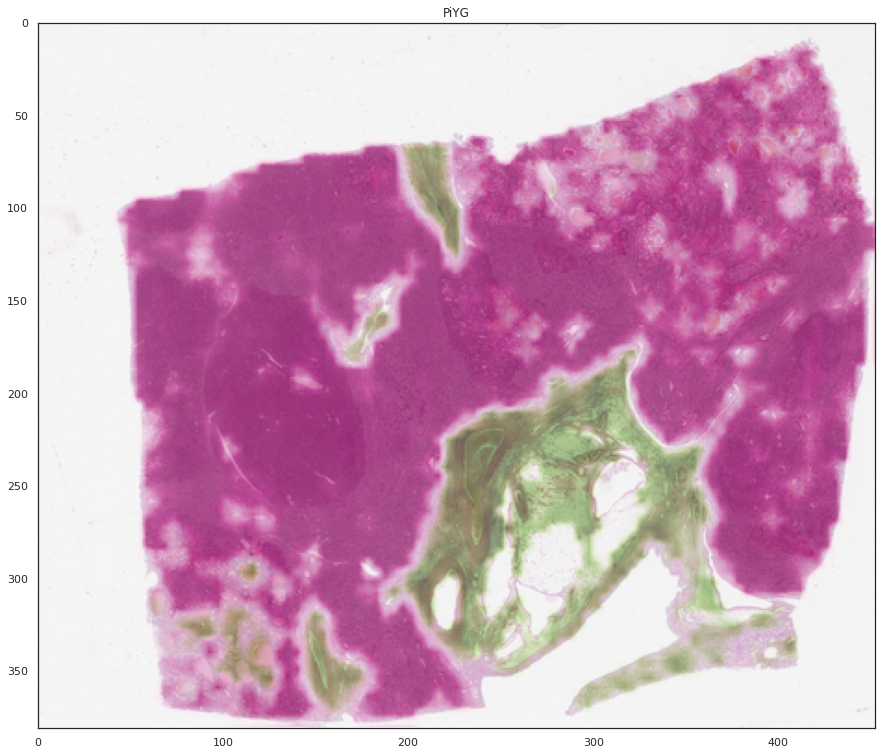

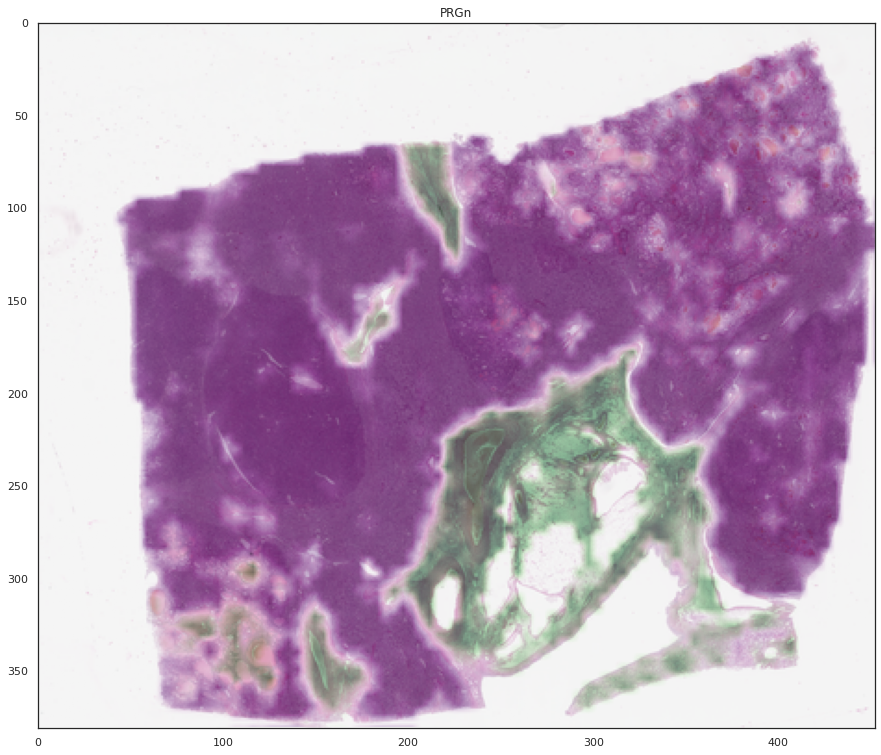

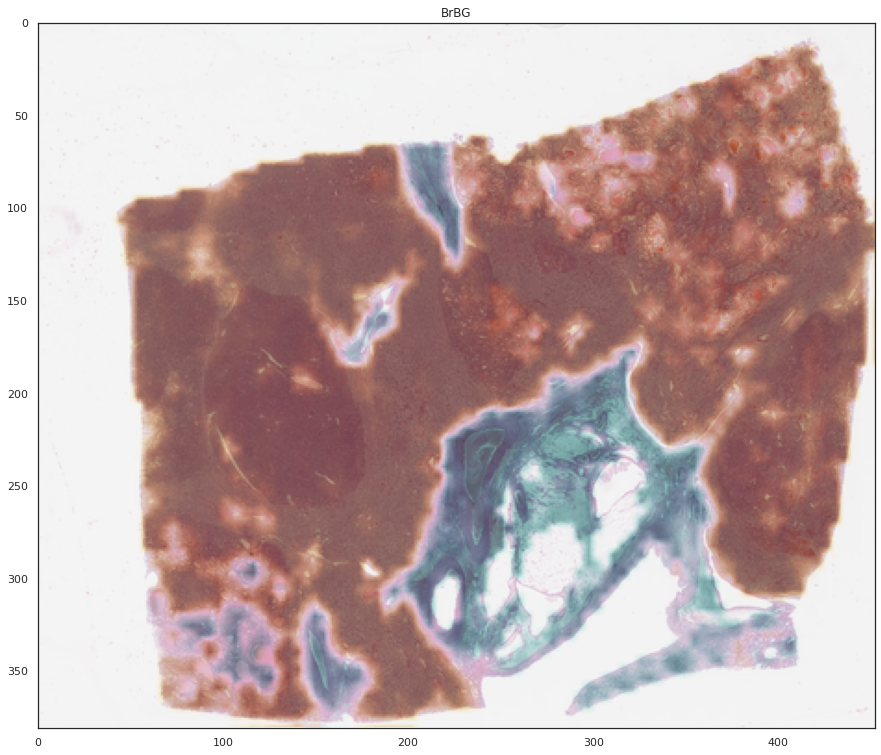

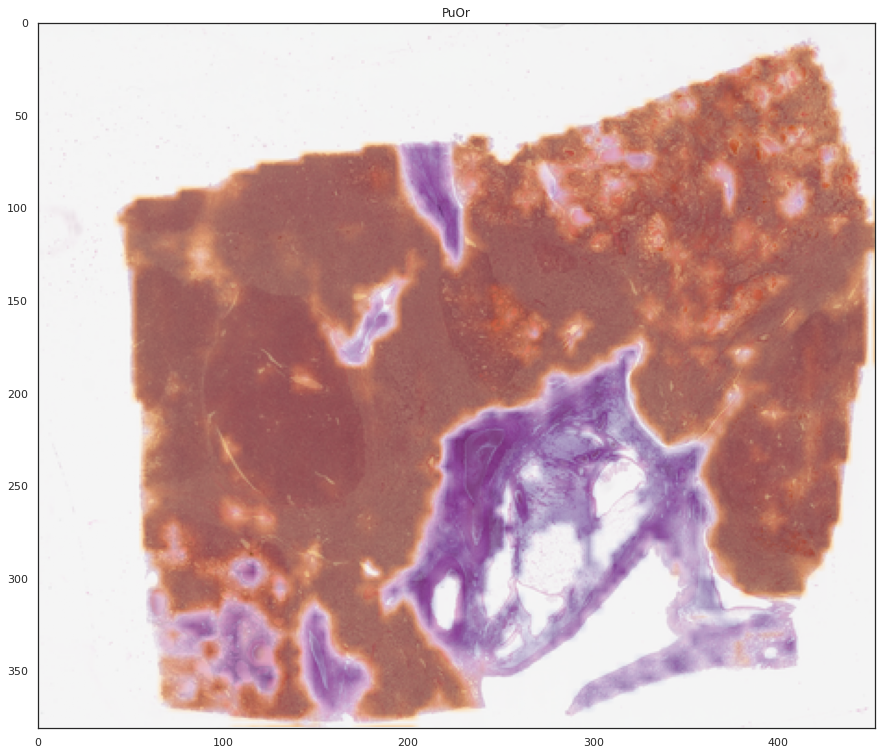

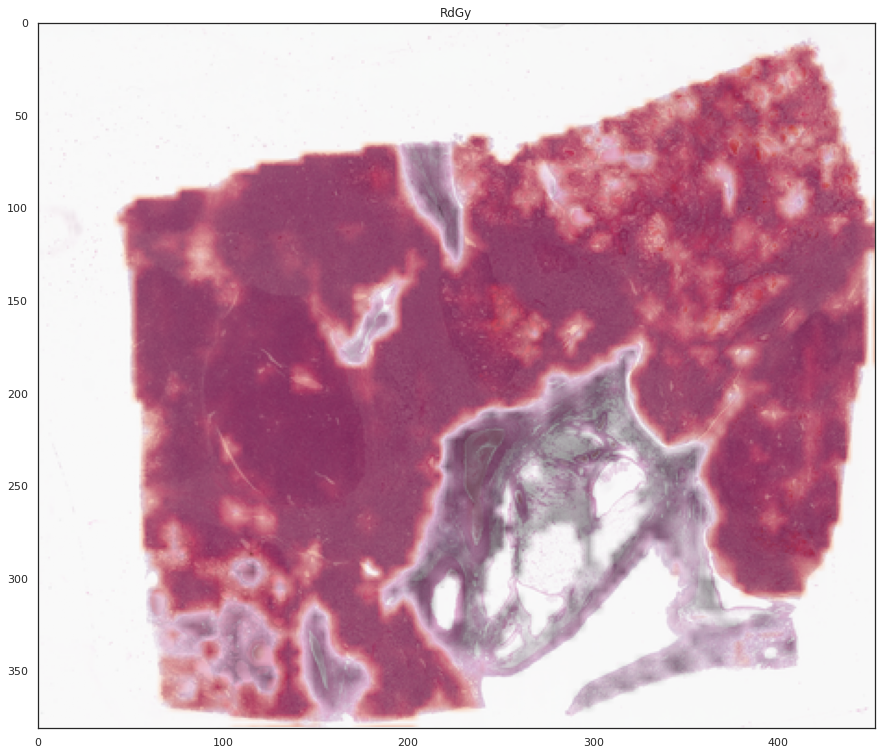

...

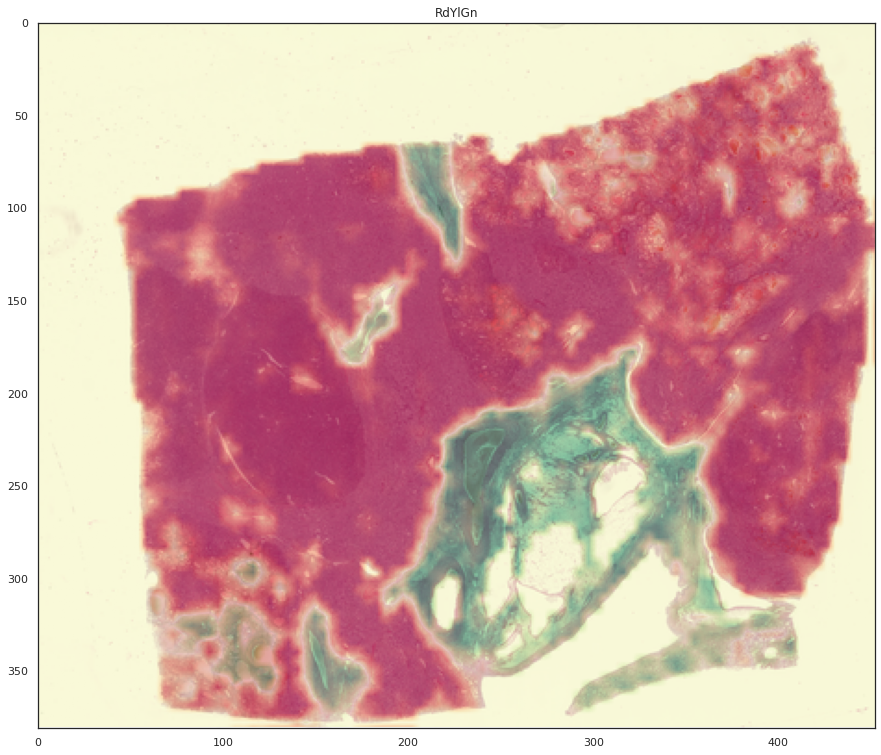

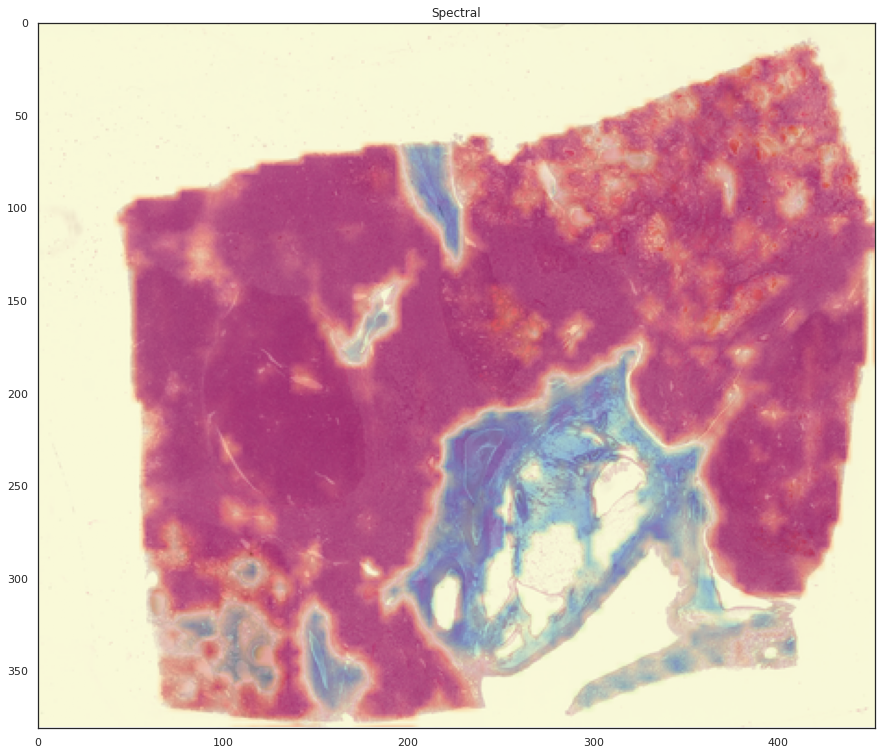

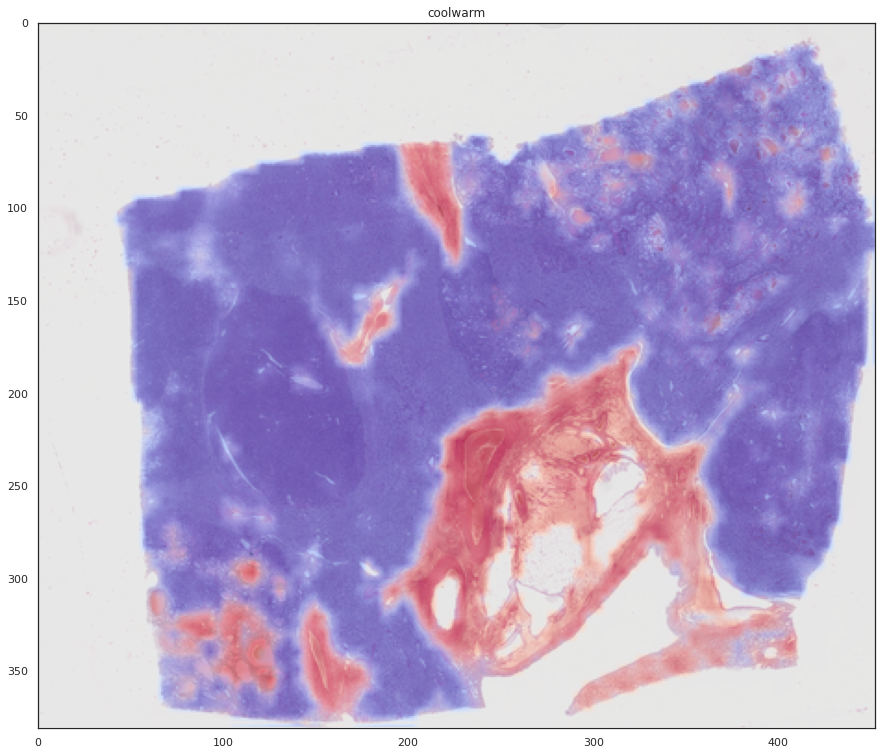

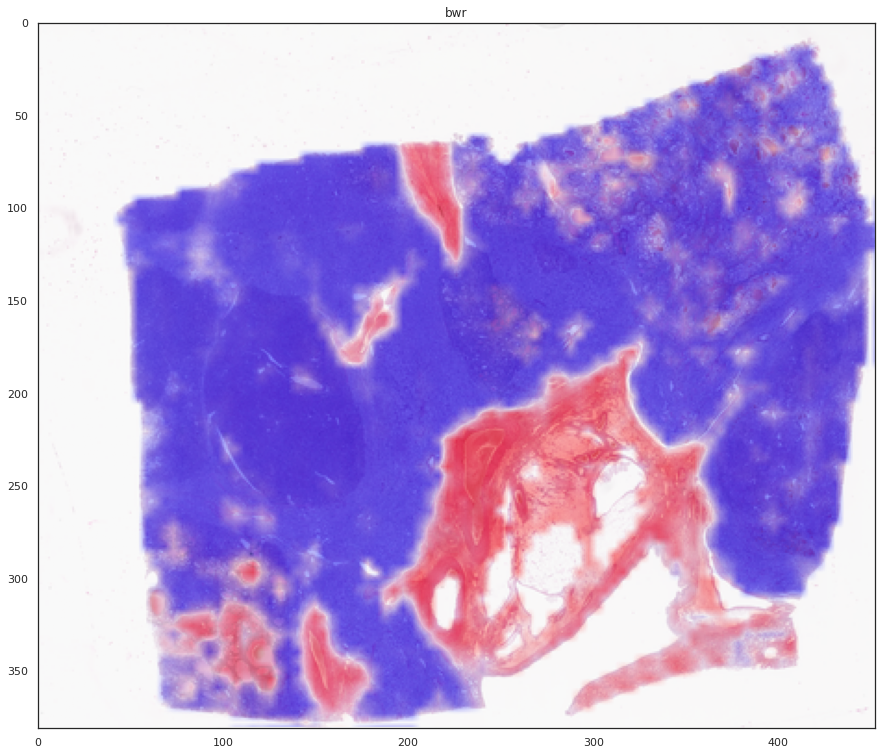

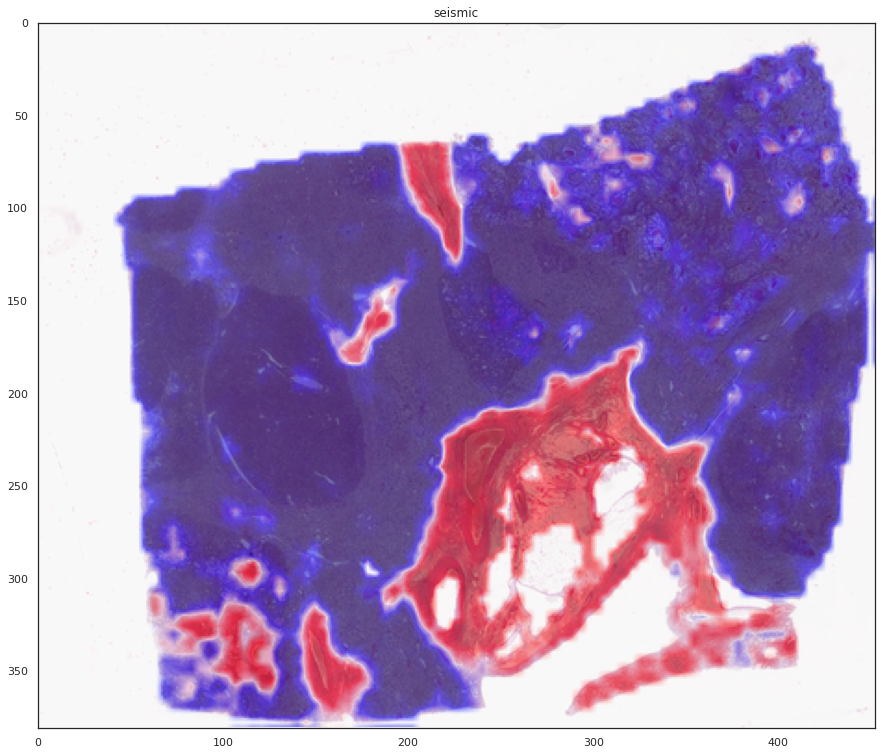

In [45]:
for tvnt_cmap in ['PiYG', 'PRGn', 'BrBG', 'PuOr', 'RdGy', 'RdBu', 'RdYlBu',
                      'RdYlGn', 'Spectral', 'coolwarm', 'bwr', 'seismic']:
    plt.title(tvnt_cmap)
    ### TUMOR VS STROMA
    heatmap = get_separated_heatmaps_simplified(input_df.reset_index().rename(columns={'tx':'x', 'ty':'y'}), col='smoothed_prob_tumor')
    ex_out = seg_out_agg[uid]
    mod_im = np.ma.masked_array(ex_out['seg_images']['all'], mask = np.isnan(ex_out['seg_images']['all'])).filled(0)
    mod_labels = np.ma.masked_array(ex_out['seg_out']['merged_labels'], mask = np.isnan(ex_out['seg_images']['all'])).filled(ex_out['seg_out']['merged_labels'].max()+1)
    label_clone = mod_labels.copy()

    overlay_copy = np.copy(heatmap)
    overlay_copy[~(label_clone == 0)] = 1-overlay_copy[~(label_clone == 0)] 
    overlay_copy[(label_clone == 0)] = 0.5

    est_scale = heatmap_to_thumb_scale
    rescaled_heatmap = rescale(overlay_copy, est_scale, anti_aliasing=True)
    plt.xlim(0,rescaled_heatmap.shape[1])
    plt.ylim(rescaled_heatmap.shape[0],0)
    plt.imshow(rescaled_heatmap, cmap=tvnt_cmap, vmin=0, vmax=1)
    plt.imshow(thumb_img, alpha=0.5)
#     plt.savefig(f'./overlays/{uid}_prob_tumor_overlay.pdf', bbox_inches='tight')
    plt.show()

In [47]:
%%capture
set_rc(15,15)

tvnt_cmap = 'PiYG'

for num_id in [972, 800, 468,700,502, 180, 678, 146, 346, 134]:
    uid = f'cm025_{num_id}'
    print(uid)
    thumbs = glob(f'/mnt/disks/manual_bms/histoqc_masks_20210422/*CA209-025;*;*{str(num_id).zfill(4)};Screening*/*thumb_small*')
    thumb_img = plt.imread(thumbs[0])
#     print(thumb_img.shape)
#     plt.imshow(thumb_img)
#     plt.savefig(f'./overlays/{uid}_hne_thumb.pdf', bbox_inches='tight')
#     plt.show()
    
    input_df = tilewise_anno.loc[uid].reset_index().set_index(['x','y'])[col_sub+['merged_labels','til_counts']]
    input_df['til_counts'] = input_df['til_counts'].astype(np.uint8)
    input_df['til_counts_normed'] = np.clip(input_df['til_counts'], 0, til_norm_vis_cutoff)/til_norm_vis_cutoff
    #     input_df['infiltrated'] = input_df['infiltrated'] & input_df['high_grade']

    input_df['infiltrated_tile'] = (input_df['til_counts'] > TIL_ISO_CUTOFF).astype(int)
    input_df['seg_vis'] = input_df['merged_labels']/input_df['merged_labels'].max()
    input_df.loc[input_df['merged_labels'].isin(get_indices(segmentmean.loc[uid, 'smoothed_prob_g4_not_g2'] >= 0.8)), 'passing_seg_label'] = True
    input_df['passing_seg_label'] = input_df['passing_seg_label'].fillna(False).astype(int)
    
    # code low grade foci as color 0 
    input_df.loc[input_df['passing_seg_label'] == 0, 'infiltrated_re'] = 0
    input_df.loc[input_df['passing_seg_label'] == 0, 'til_counts_normed'] = 0.5

    heatmap = get_separated_heatmaps_simplified(input_df.reset_index().rename(columns={'tx':'x', 'ty':'y'}), col='smoothed_prob_tumor')
    
    slide = OpenSlide(glob(f'/mnt/disks/manual_bms/*CA209-025;*;*{str(num_id).zfill(4)};Screening*svs')[0])
    
    heatmap_to_thumb_scale = 500/(slide.dimensions[0]//512)
    placeholder = -np.ones([x//512 for x in [slide.dimensions[1],slide.dimensions[0]]])
    placeholder[:heatmap.shape[0], :heatmap.shape[1]] = heatmap

    est_scale = heatmap_to_thumb_scale
    rescaled_heatmap = rescale(heatmap, est_scale, anti_aliasing=True)
    
    ### TRIMMED HNE THUMB
    plt.imshow(thumb_img)
    plt.xlim(0,rescaled_heatmap.shape[1])
    plt.ylim(rescaled_heatmap.shape[0],0)
    plt.savefig(f'./overlays/{uid}_hne_raw_trimmed.pdf')
    plt.show()
    
    ### TUMOR VS STROMA
    heatmap = get_separated_heatmaps_simplified(input_df.reset_index().rename(columns={'tx':'x', 'ty':'y'}), col='smoothed_prob_tumor')
    ex_out = seg_out_agg[uid]
    mod_im = np.ma.masked_array(ex_out['seg_images']['all'], mask = np.isnan(ex_out['seg_images']['all'])).filled(0)
    mod_labels = np.ma.masked_array(ex_out['seg_out']['merged_labels'], mask = np.isnan(ex_out['seg_images']['all'])).filled(ex_out['seg_out']['merged_labels'].max()+1)
    label_clone = mod_labels.copy()

    overlay_copy = np.copy(heatmap)
    overlay_copy[~(label_clone == 0)] = 1-overlay_copy[~(label_clone == 0)] 
    overlay_copy[(label_clone == 0)] = 0.5

    est_scale = heatmap_to_thumb_scale
    rescaled_heatmap = rescale(overlay_copy, est_scale, anti_aliasing=True)
    plt.xlim(0,rescaled_heatmap.shape[1])
    plt.ylim(rescaled_heatmap.shape[0],0)
    plt.imshow(rescaled_heatmap, cmap=tvnt_cmap, vmin=0, vmax=1)
    plt.imshow(thumb_img, alpha=0.5)
    plt.savefig(f'./overlays/{uid}_prob_tumor_overlay.pdf', bbox_inches='tight')
    plt.show()
    
    
    ### GRADE
    heatmap = get_separated_heatmaps_simplified(input_df.reset_index().rename(columns={'tx':'x', 'ty':'y'}), col='smoothed_prob_g4_not_g2')
    ex_out = seg_out_agg[uid]
    mod_im = np.ma.masked_array(ex_out['seg_images']['all'], mask = np.isnan(ex_out['seg_images']['all'])).filled(0)
    mod_labels = np.ma.masked_array(ex_out['seg_out']['merged_labels'], mask = np.isnan(ex_out['seg_images']['all'])).filled(ex_out['seg_out']['merged_labels'].max()+1)
    label_clone = mod_labels.copy()

    overlay_copy = np.copy(heatmap)
    overlay_copy[~(label_clone == 0)] = 1-overlay_copy[~(label_clone == 0)] 
    overlay_copy[(label_clone == 0)] = 0.5
    overlay_copy[(label_clone == label_clone.max())] = 0.5

    est_scale = heatmap_to_thumb_scale
    rescaled_heatmap = rescale(overlay_copy, est_scale, anti_aliasing=True)
    plt.xlim(0,rescaled_heatmap.shape[1])
    plt.ylim(rescaled_heatmap.shape[0],0)
    plt.imshow(rescaled_heatmap, cmap='PuOr', vmin=0, vmax=1)
    plt.imshow(thumb_img, alpha=0.5)
    plt.savefig(f'./overlays/{uid}_prob_g4notg2_overlay.pdf', bbox_inches='tight')
    plt.show()
    
    ### GRADE SEGS
    heatmap = get_separated_heatmaps_simplified(input_df.reset_index().rename(columns={'tx':'x', 'ty':'y'}), col='seg_vis')
    overlay_copy = np.copy(heatmap)
    overlay_copy[~(label_clone == 0)] = 1-overlay_copy[~(label_clone == 0)] 
    overlay_copy[(label_clone == 0)] = 10

    plt.xlim(0,rescaled_heatmap.shape[1])
    plt.ylim(rescaled_heatmap.shape[0],0)
    est_scale = heatmap_to_thumb_scale
    rescaled_heatmap = rescale(overlay_copy, est_scale, order=0, preserve_range=True, anti_aliasing=False)

    plt.imshow(rescaled_heatmap, cmap='Pastel1', vmin=0, vmax=1)
    plt.imshow(thumb_img, alpha=0.25)
    plt.savefig(f'./overlays/{uid}_qualitative_segment_labels_overlay.pdf', bbox_inches='tight')
    plt.show()
    
    ### HG TIL
    heatmap = get_separated_heatmaps_simplified(input_df.reset_index().rename(columns={'tx':'x', 'ty':'y'}), col='til_counts_normed')
    overlay_copy = np.copy(heatmap)
    overlay_copy[~(label_clone == 0)] = 1-overlay_copy[~(label_clone == 0)] 
    overlay_copy[(label_clone == 0)] = 0.5
    
    plt.xlim(0,rescaled_heatmap.shape[1])
    plt.ylim(rescaled_heatmap.shape[0],0)
    est_scale = heatmap_to_thumb_scale
    rescaled_heatmap = rescale(overlay_copy, est_scale, order=0, preserve_range=True, anti_aliasing=False)

    
    plt.imshow(rescaled_heatmap, cmap='RdBu', vmin=0, vmax=1)
    plt.imshow(thumb_img, alpha=0.5)
    plt.savefig(f'./overlays/{uid}_high_grade_normed_infiltration_overlay.pdf', bbox_inches='tight')
    plt.show()
    
    
    ### RAGs
    #### Proximal
    try:
        filtered_rags = prepare_distal_rag(seg_out_agg[uid], uid, edge_agg_pivot.loc[uid])
        for edge_type in ['proximal','distal']:
            ax = plt.gca()
            rag = filtered_rags[f'g_{edge_type}'].copy()
            min_segment_size = 25
            img_cmap='Reds_r'


            g = rag.copy()
            to_remove = []
            for node_name in g.nodes:
                if g.nodes[node_name]['pixel count'] < MIN_SEGMENT_SIZE:
                    to_remove.append(node_name)
            for node_name in to_remove:
                g.remove_node(node_name)

            overlay_copy = np.copy(mod_im)
            overlay_copy[~((label_clone == 0) | (label_clone == label_clone.max()))] = 1-overlay_copy[~((label_clone == 0) | (label_clone == label_clone.max()))]
            overlay_copy[(label_clone == label_clone.max())] = 0.5
            overlay_copy[(label_clone == 0)] = 0.5


            ax = plt.gca()
            lc = graph.show_rag(label_clone, g, overlay_copy, border_color='black', 
                                edge_width=5,
                                img_cmap='RdBu', edge_cmap='Greys', ax=ax)

            flipped_centroids = {node_key: (y,x) for node_key, (x,y) in nx.get_node_attributes(g,'centroid').items()}  
            edge_colors = nx.get_edge_attributes(g,'weight').values()
            nx.draw(g, flipped_centroids, ax=ax, edge_color=edge_colors, edge_vmin=0, edge_vmax=1.75, with_labels=True)
            plt.savefig(f'./overlays/{uid}_{edge_type}_rag_no_overlay_centered_RdBu.pdf', bbox_inches='tight')
            plt.show()
    except:
        print('no edge?')

In [ ]:
pause

In [ ]:
thumb_img.shape

In [ ]:
heatmap.shape

In [ ]:
401//80

In [ ]:
plt.imshow(heatmap)

In [ ]:
thumb_img = plt.imread(thumbs[1])

In [ ]:
mask_use = glob('/mnt/disks/manual_bms/histoqc_masks_20210422/*;00180;*/*mask_use*')[0]
mask_use = plt.imread(mask_use)

In [ ]:
plt.imshow(mask_use)

In [ ]:
np.where(np.argmax(mask_use == 1, axis=0))

In [ ]:
np.where(np.argmax(mask_use == 1, axis=1))

In [ ]:
thumb_img.shape

In [ ]:
heatmap.shape[0]/heatmap.shape[1]

In [ ]:
thumb_img.shape[0]/thumb_img.shape[1]

In [ ]:
(heatmap.shape[0]/heatmap.shape[1])/(thumb_img.shape[0]/thumb_img.shape[1])

In [ ]:
thumb_img.shape[0]/heatmap.shape[0]

In [ ]:
(thumb_img.shape[0]/heatmap.shape[0])/(thumb_img.shape[1]/heatmap.shape[1])

In [ ]:
thumb_img.shape[0]/heatmap.shape[0]

In [ ]:
thumb_img.shape[1]/heatmap.shape[1]

In [ ]:
10-(thumb_img.shape[1]/heatmap.shape[1])

In [ ]:
set_rc(15,15)
plt.xlim(0,rescaled_heatmap.shape[1])
plt.ylim(rescaled_heatmap.shape[0],0)
# seems like 10 - x-dim ratio adjusts correctly for the smaller thumb output of histoqc
rescaled_heatmap = rescale(heatmap, 10-(thumb_img.shape[1]/heatmap.shape[1]), anti_aliasing=True)
plt.imshow(rescaled_heatmap)
plt.imshow(thumb_img, alpha=0.4)

plt.savefig('./cm025_180_overlays/high_grade_normed_infiltration_overlay.pdf')

In [ ]:
heatmap = get_separated_heatmaps_simplified(input_df.reset_index().rename(columns={'tx':'x', 'ty':'y'}), col='smoothed_prob_g4_not_g2')
overlay_copy = np.copy(heatmap)
overlay_copy[~(label_clone == 0)] = 1-overlay_copy[~(label_clone == 0)] 
overlay_copy[(label_clone == 0)] = 0.5
overlay_copy[(label_clone == label_clone.max())] = 0.5

# overlay_copy[(label_clone == label_clone.max())] = 15.

set_rc(15,15)
plt.xlim(0,rescaled_heatmap.shape[1])
plt.ylim(rescaled_heatmap.shape[0],0)
# seems like 10 - x-dim ratio adjusts correctly for the smaller thumb output of histoqc
rescaled_heatmap = rescale(overlay_copy, 10-(thumb_img.shape[1]/heatmap.shape[1]), anti_aliasing=True)
plt.imshow(rescaled_heatmap, cmap='PuOr', vmin=0, vmax=1)
plt.imshow(thumb_img, alpha=0.5)

plt.savefig('./cm025_180_overlays/prob_g4notg2_overlay.pdf')

In [ ]:
plt.imshow(thumb_img)
plt.xlim(0,rescaled_heatmap.shape[1])
plt.ylim(rescaled_heatmap.shape[0],0)
plt.savefig('./cm025_180_overlays/hne_raw_trimmed.pdf')

In [ ]:
heatmap = get_separated_heatmaps_simplified(input_df.reset_index().rename(columns={'tx':'x', 'ty':'y'}), col='smoothed_prob_tumor')
overlay_copy = np.copy(heatmap)
overlay_copy[~(label_clone == 0)] = 1-overlay_copy[~(label_clone == 0)] 
overlay_copy[(label_clone == 0)] = 0.5

# overlay_copy[(label_clone == label_clone.max())] = 15.
# 
set_rc(15,15)
plt.xlim(0,rescaled_heatmap.shape[1])
plt.ylim(rescaled_heatmap.shape[0],0)
# seems like 10 - x-dim ratio adjusts correctly for the smaller thumb output of histoqc
rescaled_heatmap = rescale(overlay_copy, 10-(thumb_img.shape[1]/heatmap.shape[1]), anti_aliasing=True)
plt.imshow(rescaled_heatmap, cmap='RdBu', vmin=0, vmax=1)
plt.imshow(thumb_img, alpha=0.5)

plt.savefig('./cm025_180_overlays/prob_tumor_overlay.pdf')

In [ ]:
heatmap = get_separated_heatmaps_simplified(input_df.reset_index().rename(columns={'tx':'x', 'ty':'y'}), col='seg_vis')
overlay_copy = np.copy(heatmap)
overlay_copy[~(label_clone == 0)] = 1-overlay_copy[~(label_clone == 0)] 
overlay_copy[(label_clone == 0)] = 10

# overlay_copy[(label_clone == label_clone.max())] = 15.

set_rc(15,15)
plt.xlim(0,rescaled_heatmap.shape[1])
plt.ylim(rescaled_heatmap.shape[0],0)
# seems like 10 - x-dim ratio adjusts correctly for the smaller thumb output of histoqc
rescaled_heatmap = rescale(overlay_copy, 10-(thumb_img.shape[1]/heatmap.shape[1]), order=0, preserve_range=True, anti_aliasing=False)

plt.imshow(rescaled_heatmap, cmap='Pastel1', vmin=0, vmax=1)
plt.imshow(thumb_img, alpha=0.4)

plt.savefig('./cm025_180_overlays/qualitative_segment_labels_overlay.pdf')

In [ ]:
heatmap = get_separated_heatmaps_simplified(input_df.reset_index().rename(columns={'tx':'x', 'ty':'y'}), col='til_counts_normed')
overlay_copy = np.copy(heatmap)
overlay_copy[~(label_clone == 0)] = 1-overlay_copy[~(label_clone == 0)] 
overlay_copy[(label_clone == 0)] = 0.5

# overlay_copy[(label_clone == label_clone.max())] = 15.
# 
set_rc(15,15)
plt.xlim(0,rescaled_heatmap.shape[1])
plt.ylim(rescaled_heatmap.shape[0],0)
# seems like 10 - x-dim ratio adjusts correctly for the smaller thumb output of histoqc
rescaled_heatmap = rescale(overlay_copy, 10-(thumb_img.shape[1]/heatmap.shape[1]), anti_aliasing=True)

## optional: writing non-HG regions as middle of diverging palate 
# mask = get_separated_heatmaps_simplified(input_df.reset_index().rename(columns={'tx':'x', 'ty':'y'}), col='passing_seg_label')
# mask = rescale(mask, 10-(thumb_img.shape[1]/heatmap.shape[1]), anti_aliasing=True)
# rescaled_heatmap[mask == 0] = 0.5

plt.imshow(rescaled_heatmap, cmap='RdBu', vmin=0, vmax=1)
plt.imshow(thumb_img, alpha=0.5)
plt.savefig('./cm025_180_overlays/high_grade_normed_infiltration_overlay.pdf')